# Firstly: Download the required libraries

In [4]:
import tkinter as tk
from tkinter import filedialog
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# secondly: Create a tkinter window

In [5]:
# إنشاء نافذة tkinter
root = tk.Tk()
root.withdraw()  # إخفاء النافذة الرئيسية


''

# Thirdly: The functions that need to be implemented automatically

## Func1. Read data of any file

In [6]:
def read_dataset(file_path):
    
    # التحقق من نوع الملف
    if file_path.endswith(".csv"):
        data = pd.read_csv(file_path)
        print("تم تحميل ملف CSV بنجاح.")

    elif file_path.endswith(".txt"):
        data = pd.read_csv(file_path, sep="\t")  # قراءة ملف نصي مع فاصل مخصص
        print("تم تحميل ملف Text بنجاح.")

    elif file_path.endswith(".xlsx"):
        data = pd.read_excel(file_path)  # قراءة ملف نصي مع فاصل مخصص
        print("تم تحميل ملف excel بنجاح.")
    else:
        print("النوع غير مدعوم.")
    return data

## Func2. Know the types of data

In [7]:
def infer_column_types(dataset):
    column_types = dataset.dtypes
    return column_types

## Func3. Recognize the format of the data and the individual values in each column

In [8]:
def dataset_info(dataset):
    # عرض حجم مجموعة البيانات (عدد الصفوف والأعمدة)
    num_rows, num_columns = dataset.shape
    print(f"حجم مجموعة البيانات: {num_rows} صفوف، {num_columns} أعمدة\n")

    # عرض عدد القيم الفريدة في كل عمود
    unique_values_info = dataset.nunique()
    print("عدد القيم الفريدة في كل عمود:")
    print(unique_values_info)

## Func4. Check for duplicate values

In [9]:
def find_duplicates(dataframe):
    """
    تعثر الدالة على السجلات المتكررة في DataFrame وتعيد العدد المرات التي تم تكرار كل سجل.

    :param dataframe: DataFrame - مجموعة البيانات.
    :return: str - رسالة توضح وجود القيم المتكررة وعددها إذا وجدت، ورسالة توضح عدم وجودها إذا لم يكن هناك.
    """
    duplicates = dataframe[dataframe.duplicated(keep=False)]  # السجلات المتكررة
    if not duplicates.empty:
        duplicate_counts = duplicates.value_counts().to_dict()  # عدد مرات تكرار السجلات كقاموس
        message = "السجلات المتكررة وعدد مرات تكرارها:\n"
        for key, value in duplicate_counts.items():
            message += f"{key}: {value} مرة\n"
            
        # حذف السجلات المتكررة
        dataframe.drop_duplicates(keep='first', inplace=True)
        message += "\nتم حذف السجلات المتكررة."
        
    else:
        message = "لا توجد قيم متكررة في مجموعة البيانات."

    return message

## Func5. Data encoding

In [10]:
from sklearn.preprocessing import LabelEncoder

def label_encode_categorical_variables(dataframe, columns_to_encode):
    """
    تقوم الدالة بترميز المتغيرات الفئوية في DataFrame باستخدام Label Encoding.

    :param dataframe: DataFrame - مجموعة البيانات.
    :param columns_to_encode: list - قائمة بأسماء الأعمدة الفئوية التي تحتاج إلى ترميز.
    :return: DataFrame - نسخة من مجموعة البيانات مع المتغيرات المفهومة.
    """
    encoded_dataframe = dataframe.copy()
    label_encoder = LabelEncoder()

    for column in columns_to_encode:
        encoded_dataframe[column] = label_encoder.fit_transform(encoded_dataframe[column])

    return encoded_dataframe


## Func6. Standardize data measurement

In [11]:
from sklearn.preprocessing import StandardScaler

def scale_all_numeric_columns(dataframe):
    """
    تقوم الدالة بتقليل (Scaling) جميع المتغيرات العددية في DataFrame باستخدام StandardScaler.

    :param dataframe: DataFrame - مجموعة البيانات.
    :return: DataFrame - نسخة من مجموعة البيانات بعد التقليل.
    """
    scaled_dataframe = dataframe.copy()
    scaler = StandardScaler()

    numeric_columns = scaled_dataframe.select_dtypes(include=['number']).columns
    scaled_dataframe[numeric_columns] = scaler.fit_transform(scaled_dataframe[numeric_columns])

    return scaled_dataframe


## Func7. Check for missing values

In [12]:
def check_missing_values(dataset):
    missing_values = dataset.isnull().sum()
    return missing_values

## Func8. Handling missing values

In [13]:
def handle_missing_values(dataset):
    # التعامل مع الأعمدة الصحيحة والعشرية
    numeric_columns = dataset.select_dtypes(include=['int', 'float64']).columns
    for col in numeric_columns:
        if dataset[col].isnull().any():
            median_value = dataset[col].median()
            dataset[col].fillna(median_value, inplace=True)

    # التعامل مع الأعمدة من نوع object 
    object_columns = dataset.select_dtypes(include=['object']).columns
    for col in object_columns:
        if dataset[col].isnull().any():
            mode_value = dataset[col].mode()[0]
            dataset[col].fillna(mode_value, inplace=True)


## Func9. Checking and treating outliers


In [14]:

def handle_outliers_iqr(dataset, iqr_factor=1.5, replace_with=None):
    """
    تقوم هذه الدالة بمعالجة القيم المتطرفة في البيانات العددية باستخدام النطاق بين الربعين الداخلي (IQR).

    :param dataset: DataFrame - مجموعة البيانات التي تحتوي على البيانات العددية.
    :param iqr_factor: float - عامل تكبير لحساب حجم النطاق بين الربعين الداخلي (افتراضيًا 1.5).
    :param replace_with: float or None - القيمة التي ستستبدل بها القيم المتطرفة (None للإزالة) (افتراضيًا None).
    :return: DataFrame - مجموعة البيانات بعد معالجة القيم المتطرفة.
    """
    # حساب الربع الأول والثالث
    Q1 = dataset.quantile(0.25)
    Q3 = dataset.quantile(0.75)

    # حساب IQR (النطاق بين الربعين الداخلي)
    IQR = Q3 - Q1

    # تحديد الحدود السفلية والعليا للقيم المتطرفة
    lower_bound = Q1 - (iqr_factor * IQR)
    upper_bound = Q3 + (iqr_factor * IQR)

    # معالجة القيم المتطرفة باستبدالها بالقيمة المحددة
    dataset_no_outliers = dataset.copy()
    for col in dataset.columns:
        if replace_with is not None:
            dataset_no_outliers[col] = dataset_no_outliers[col].clip(lower=lower_bound[col], upper=upper_bound[col])
        else:
            dataset_no_outliers = dataset_no_outliers[(dataset_no_outliers[col] >= lower_bound[col]) & (dataset_no_outliers[col] <= upper_bound[col])]

    return dataset_no_outliers


## Func10. Statistical description of numerical columns

In [15]:
def numeric_column_stats(dataset):
    # الأعمدة العددية
    numeric_columns = dataset.select_dtypes(include=['int', 'float'])
    if not numeric_columns.empty:
        print("الوصف الإحصائي للأعمدة العددية:")
        #print(numeric_columns.describe(), '\n')
        return numeric_columns.describe()


## Func11. Statistical description of categorical columns

In [16]:
def object_column_stats(dataset):
    # الأعمدة الفئوية
    object_columns = dataset.select_dtypes(include=['object'])
    #for col in object_columns:
    print("الوصف الإحصائي للأعمدة الفئوية:")
    #print(dataset[col].value_counts(), '\n')
    return object_columns.describe(include=["object", "bool"])


## Func12. Draw the frequency distribution of the data

In [17]:

# دالة لرسم histograms للبيانات العددية
def plot_histograms(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    for column in numeric_columns:
        plt.figure(figsize=(8, 4))
        sns.histplot(data=dataframe, x=column, kde=True)
        plt.title(f"Histogram For numerical data - {column}")
        plt.xlabel(column)
        plt.ylabel("Frequency of values")
        plt.show()

## Func12. Draw Box Plot of the data

In [18]:
# دالة لرسم box plots للبيانات العددية
def plot_box_plots(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    for column in numeric_columns:
        plt.figure(figsize=(8, 4))
        sns.boxplot(data=dataframe, y=column)
        plt.title(f"Box Plot For numerical data - {column}")
        plt.ylabel(column)
        plt.show()

## Func13. Draw Scatter Plot of the data

In [19]:
# دالة لرسم scatter plots بين الأعمدة العددية
def plot_scatter_plots(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    if len(numeric_columns) >= 2:
        for i in range(len(numeric_columns)):
            for j in range(i + 1, len(numeric_columns)):
                plt.figure(figsize=(8, 6))
                sns.scatterplot(data=dataframe, x=numeric_columns[i], y=numeric_columns[j])
                plt.title(f"Scatter Plot VS {numeric_columns[i]} و{numeric_columns[j]}")
                plt.xlabel(numeric_columns[i])
                plt.ylabel(numeric_columns[j])
                plt.show()

## Func14. Draw correlation_heatmap of the data

In [20]:


def plot_correlation_heatmap(dataframe):
    """
    تقوم الدالة بحساب معاملات الارتباط ورسم Heatmap للسمات العددية في مجموعة البيانات.

    :param dataframe: DataFrame - مجموعة البيانات.
    """
    # استخراج السمات العددية
    numeric_columns = dataframe.select_dtypes(include=['number'])
    
    # حساب معاملات الارتباط
    correlation_matrix = numeric_columns.corr()
    
    # تعديل القيم لتقريبها لأقرب عدد عشري
    correlation_matrix = np.round(correlation_matrix, decimals=2)
    
    # رسم Heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title("Heatmap For correlation coefficients between numerical features")
    plt.show()


# Fourth: Enter data from any source

In [21]:
# الحصول على مسار الملف المحدد بواسطة المستخدم
file_path = filedialog.askopenfilename(title="اختر ملف CSV أو Text أو xlsx")

In [22]:
dataset = read_dataset(file_path)
print("مجموعة البيانات:")
dataset = pd.DataFrame(dataset)
dataset

تم تحميل ملف CSV بنجاح.
مجموعة البيانات:


,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2006,2006,5,12016,GUM,5,13162,MAJ,844,20177,PFQ,1,Departures,0,10,10
1,05/01/2003,2003,5,10299,ANC,1,13856,OKO,736,20007,5Y,1,Departures,0,15,15
2,03/01/2007,2007,3,10721,BOS,13,12651,KEF,439,20402,GL,1,Departures,0,1,1
3,12/01/2004,2004,12,11259,DAL,74,16271,YYZ,936,20201,AMQ,1,Departures,0,1,1
4,05/01/2009,2009,5,13303,MIA,33,11075,CMW,219,21323,5L,0,Departures,0,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,07/01/2000,2000,7,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1422,0,1422
930804,04/01/2019,2019,4,13303,MIA,33,14286,PTY,162,19770,CM,0,Departures,1439,0,1439
930805,08/01/2000,2000,8,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1441,0,1441
930806,09/01/2004,2004,9,12266,IAH,74,15632,VSA,148,19534,AM,0,Departures,1461,0,1461


# Fifth: data exploration

## 1. Data type

In [23]:
column_types = infer_column_types(dataset)
print("أنواع الأعمدة:")
print(column_types)
         

أنواع الأعمدة:
data_dte        object
Year             int64
Month            int64
usg_apt_id       int64
usg_apt         object
usg_wac          int64
fg_apt_id        int64
fg_apt          object
fg_wac           int64
airlineid        int64
carrier         object
carriergroup     int64
type            object
Scheduled        int64
Charter          int64
Total            int64
dtype: object


## 2. The size of the data set and the unique values in each column

In [24]:
# عرض معلومات مجموعة البيانات
dataset_info(dataset)

حجم مجموعة البيانات: 930808 صفوف، 16 أعمدة

عدد القيم الفريدة في كل عمود:
data_dte         363
Year              31
Month             12
usg_apt_id      1015
usg_apt         1022
usg_wac           54
fg_apt_id       1666
fg_apt          1669
fg_wac           229
airlineid        705
carrier          734
carriergroup       2
type               1
Scheduled        883
Charter          255
Total            886
dtype: int64


## 3. Find duplicate records

In [25]:
# استدعاء الدالة للبحث عن السجلات المتكررة
duplicates_dict = find_duplicates(dataset)


In [26]:

# استدعاء الدالة للبحث عن السجلات المتكررة وعرض الرسالة
message = find_duplicates(dataset)
print(message)


لا توجد قيم متكررة في مجموعة البيانات.


## 4. Statistical description of numerical columns

In [27]:
numeric_column_stats(dataset).round(1).T

الوصف الإحصائي للأعمدة العددية:


,count,mean,std,min,25%,50%,75%,max
Year,930808.0,2006.0,8.6,1990.0,1999.0,2007.0,2014.0,2020.0
Month,930808.0,6.4,3.5,1.0,3.0,6.0,9.0,12.0
usg_apt_id,930808.0,12809.5,2716.2,10010.0,11618.0,12892.0,13487.0,99999.0
usg_wac,930808.0,42.5,27.6,1.0,22.0,33.0,72.0,93.0
fg_apt_id,930808.0,13484.7,1932.6,10119.0,11868.0,13408.0,15084.0,16881.0
fg_wac,930808.0,466.9,288.0,106.0,205.0,427.0,736.0,975.0
airlineid,930808.0,20057.2,479.1,19386.0,19704.0,19991.0,20312.0,22067.0
carriergroup,930808.0,0.6,0.5,0.0,0.0,1.0,1.0,1.0
Scheduled,930808.0,40.0,60.9,0.0,0.0,17.0,60.0,2019.0
Charter,930808.0,2.0,8.3,0.0,0.0,0.0,1.0,1092.0


## 5. Statistical description of categorical columns

In [28]:
object_column_stats(dataset).round(2).T

الوصف الإحصائي للأعمدة الفئوية:


,count,unique,top,freq
data_dte,930808,363,03/01/2018,3471
usg_apt,930808,1022,MIA,133820
fg_apt,930808,1669,YYZ,50044
carrier,927753,734,AA,58739
type,930808,1,Departures,930808


## 6. Check for missing values in the data set 

In [29]:
# فحص القيم المفقودة في مجموعة البيانات
missing_values = check_missing_values(dataset)
missing_values

data_dte           0
Year               0
Month              0
usg_apt_id         0
usg_apt            0
usg_wac            0
fg_apt_id          0
fg_apt             0
fg_wac             0
airlineid          0
carrier         3055
carriergroup       0
type               0
Scheduled          0
Charter            0
Total              0
dtype: int64

# Sixth: Initial data visualization

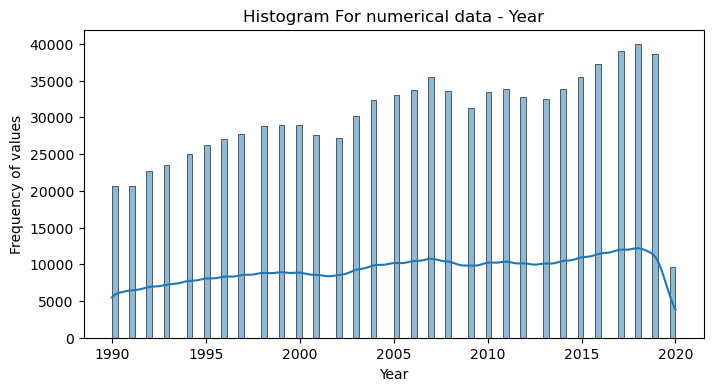

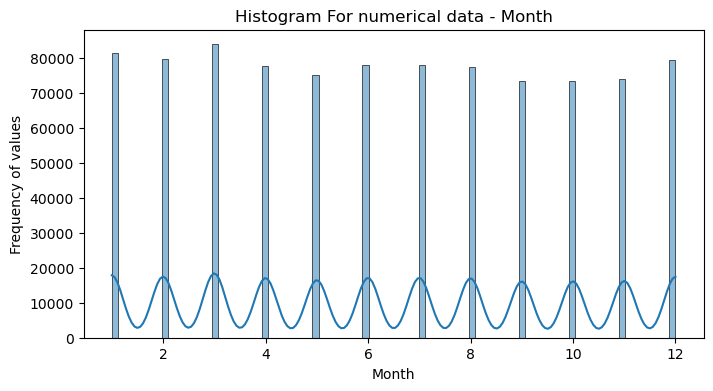

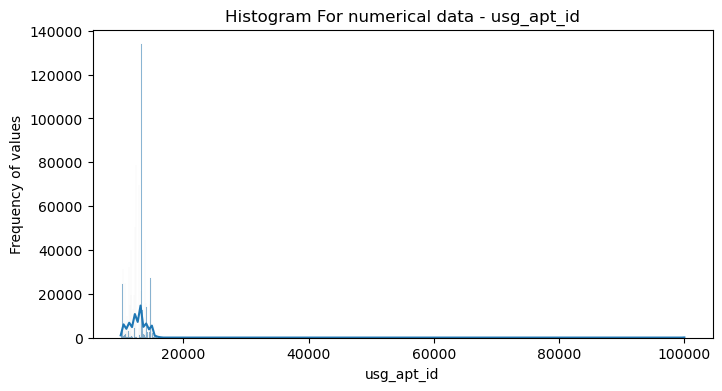

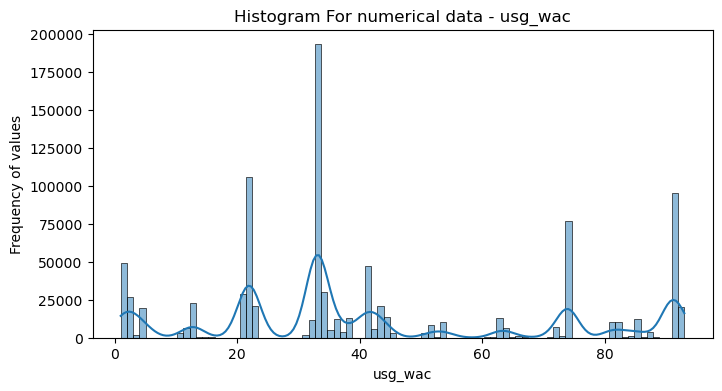

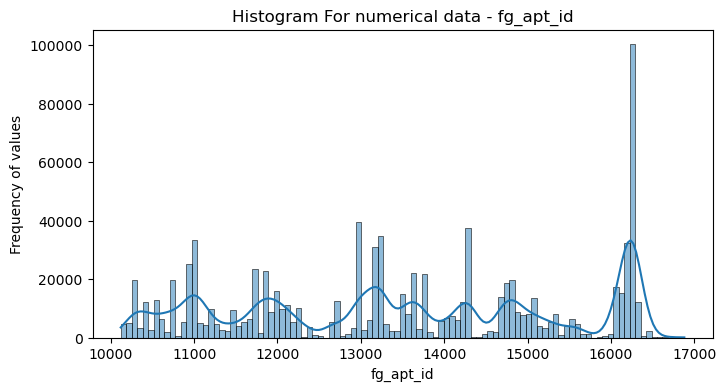

...

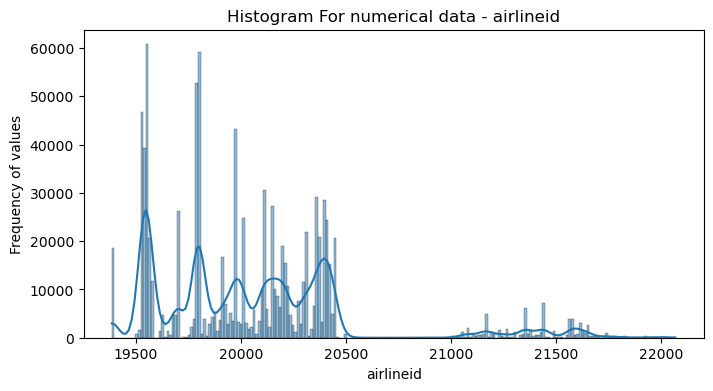

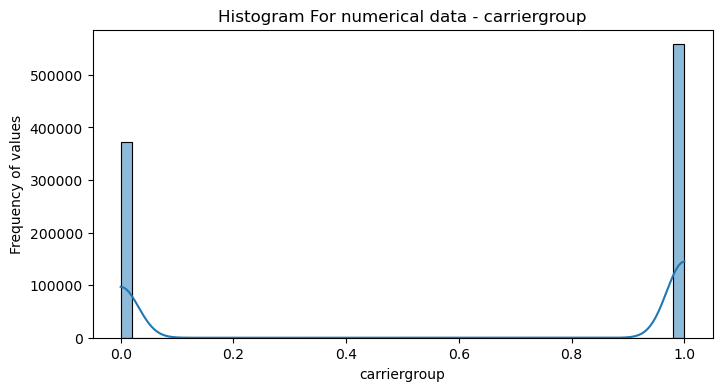

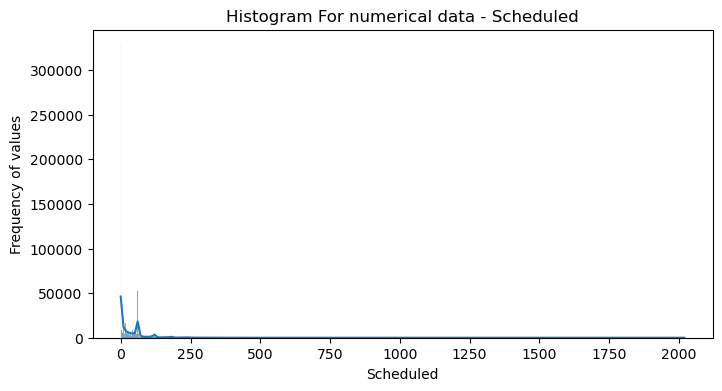

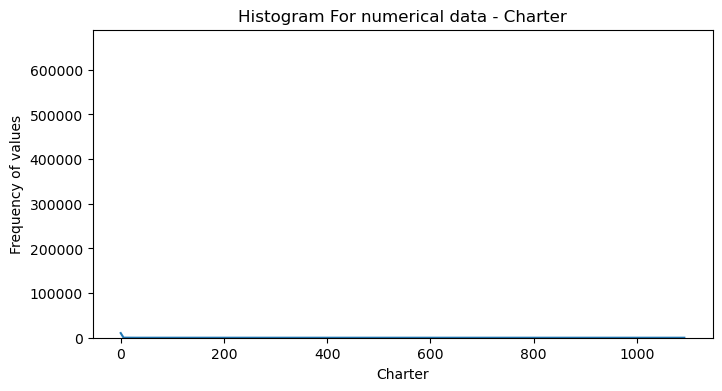

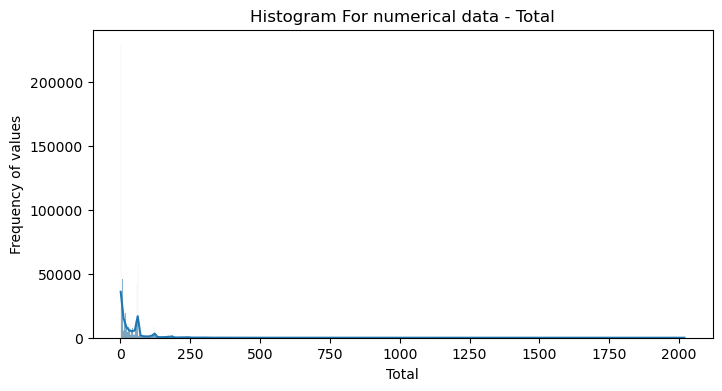

In [30]:
# استدعاء الدوال لرسم التصورات
plot_histograms(dataset)  # رسم histograms


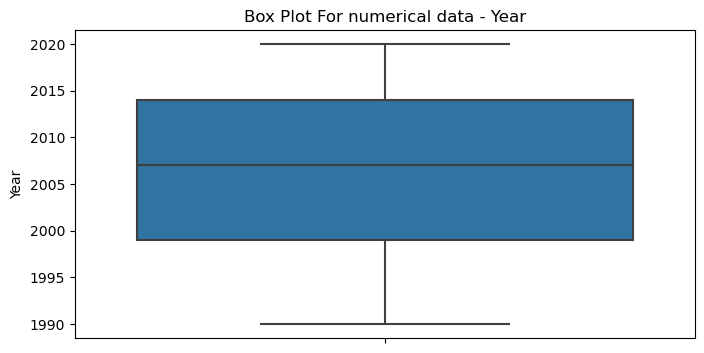

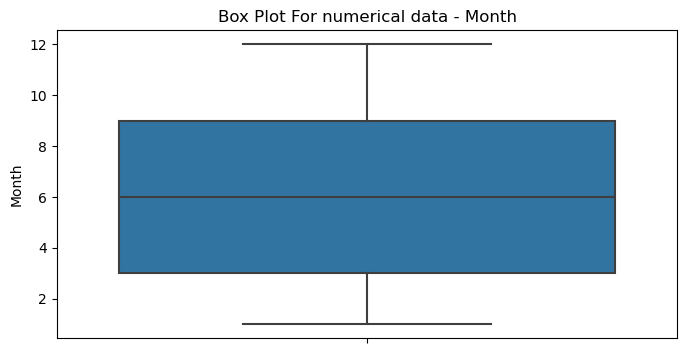

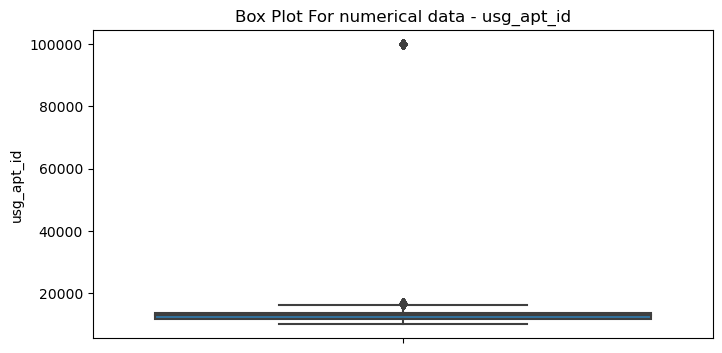

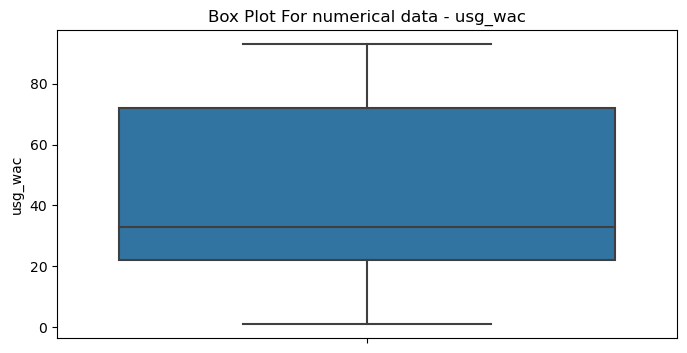

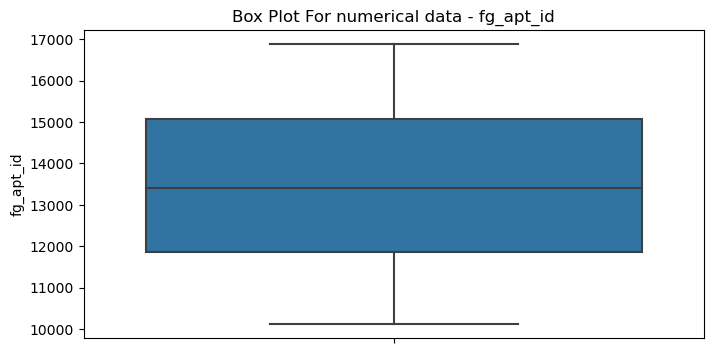

...

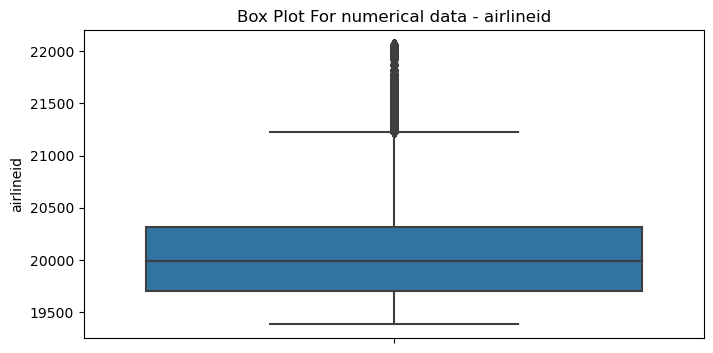

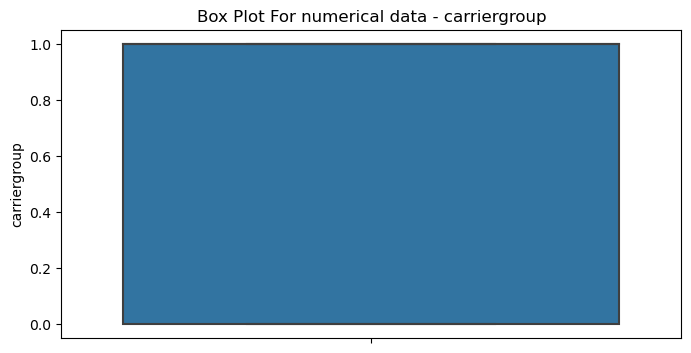

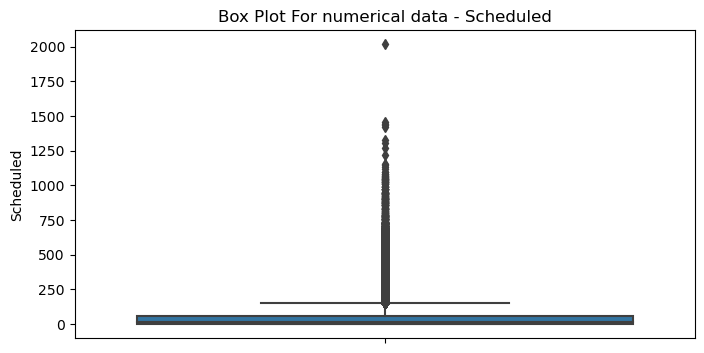

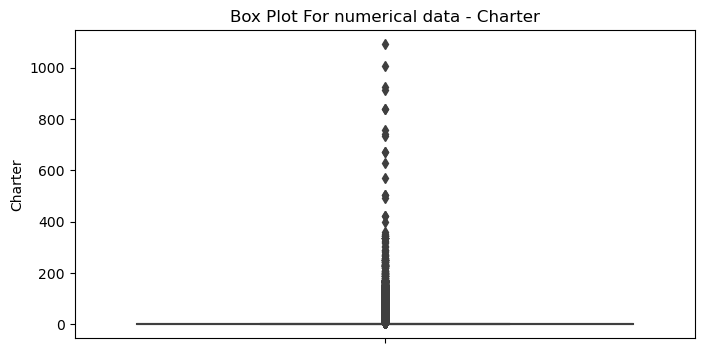

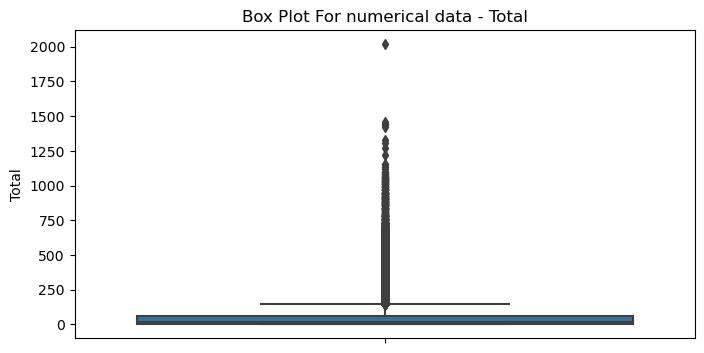

In [31]:
plot_box_plots(dataset)  # رسم box plots


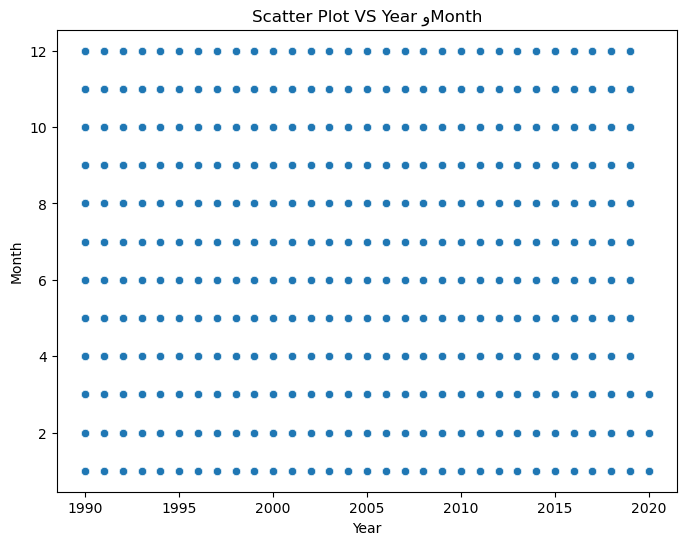

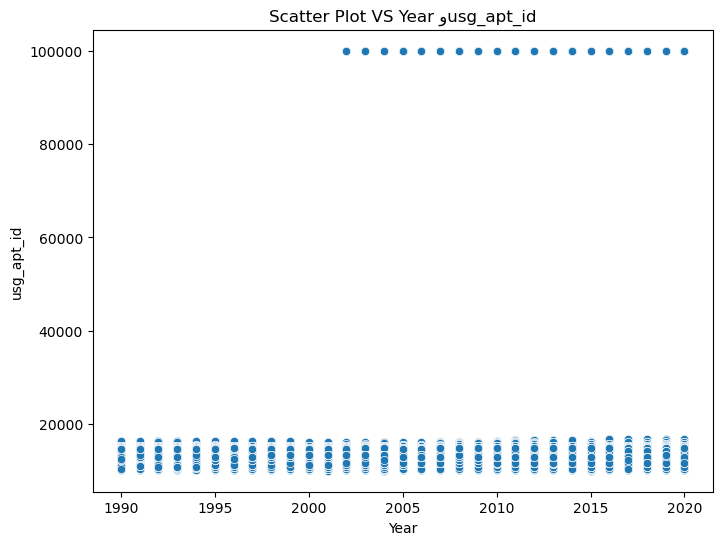

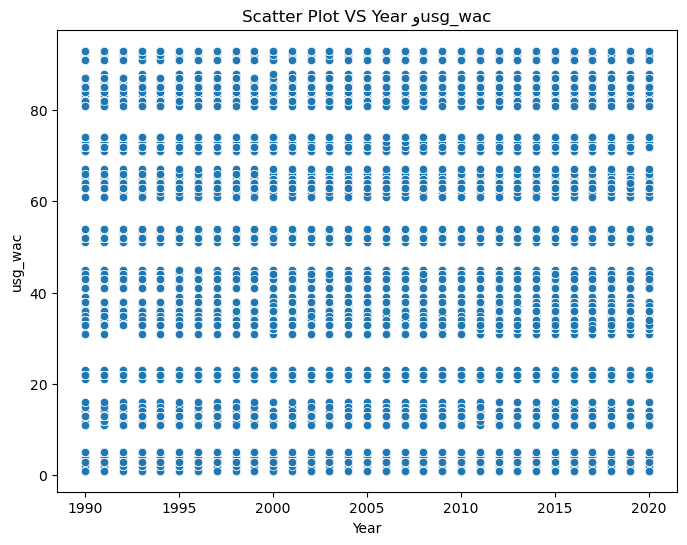

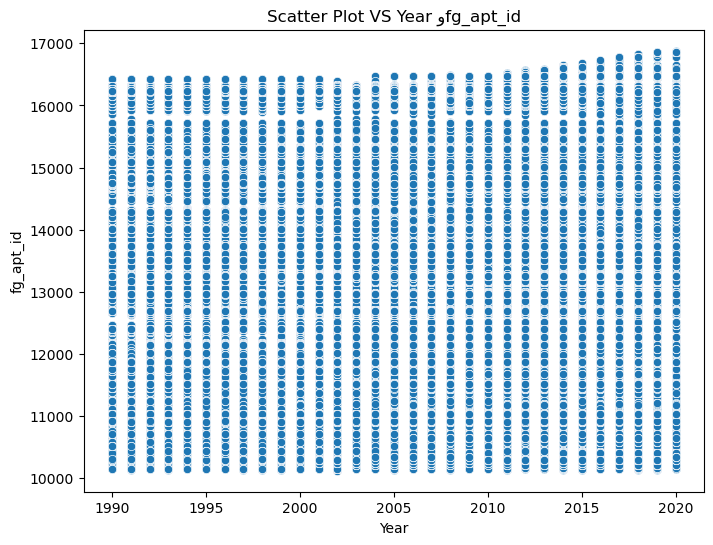

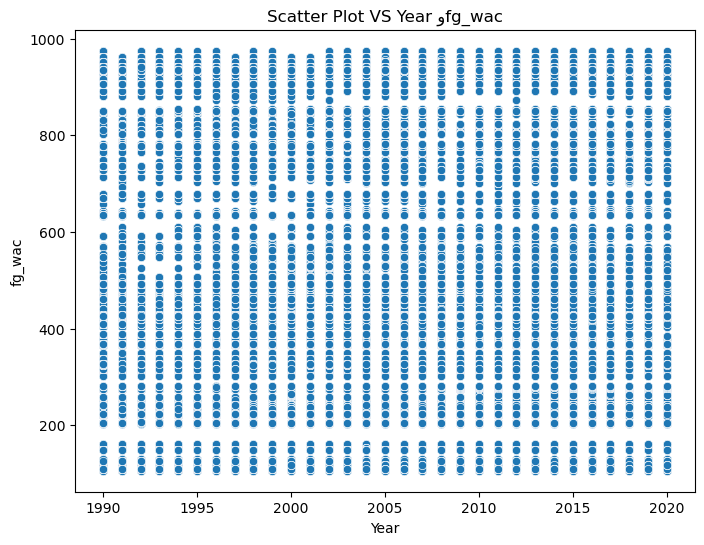

...

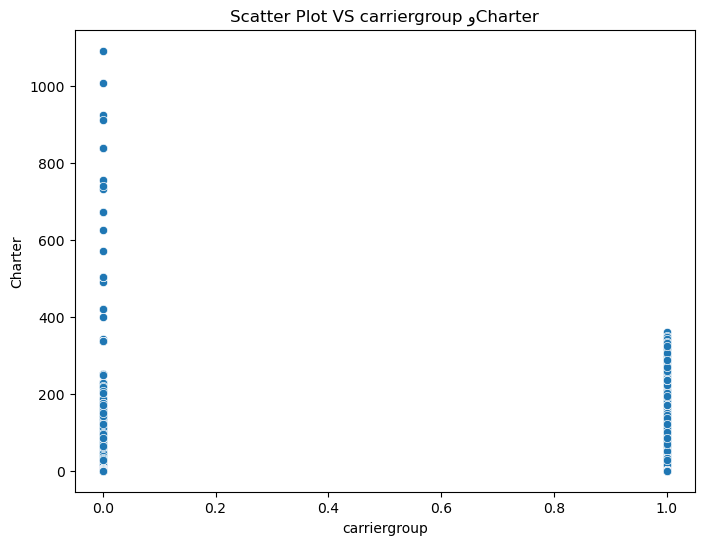

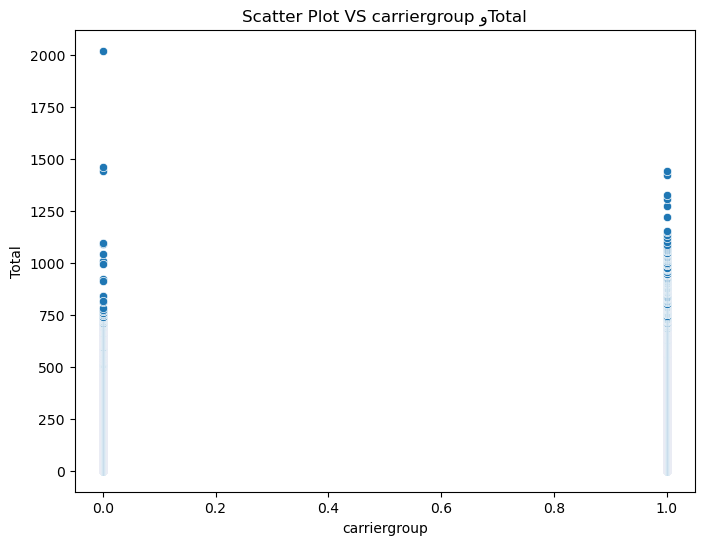

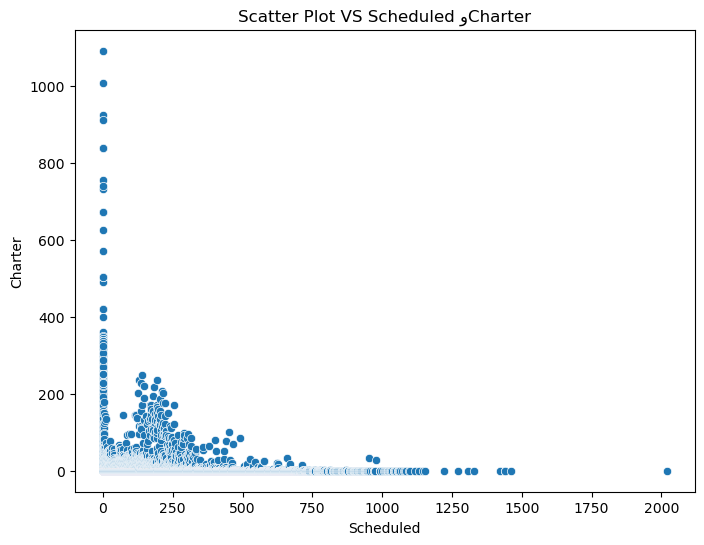

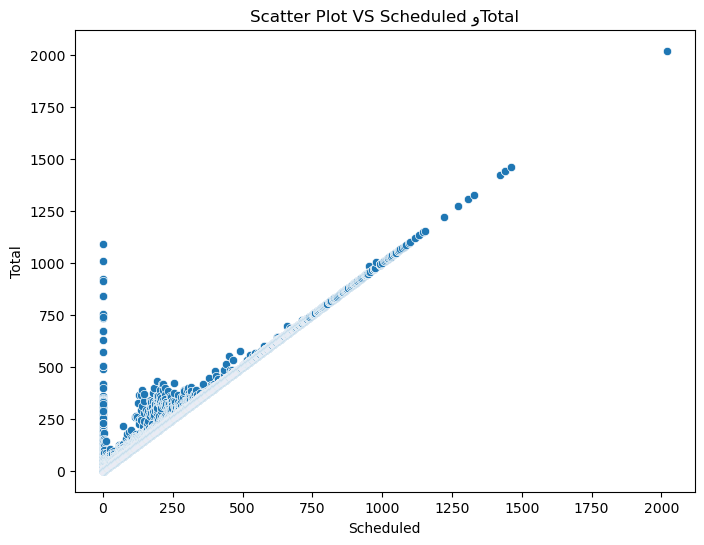

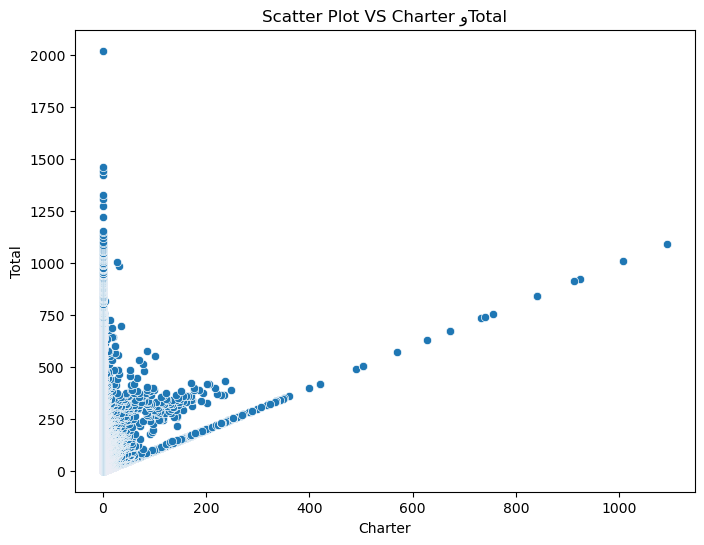

In [32]:
plot_scatter_plots(dataset)  # رسم scatter plots


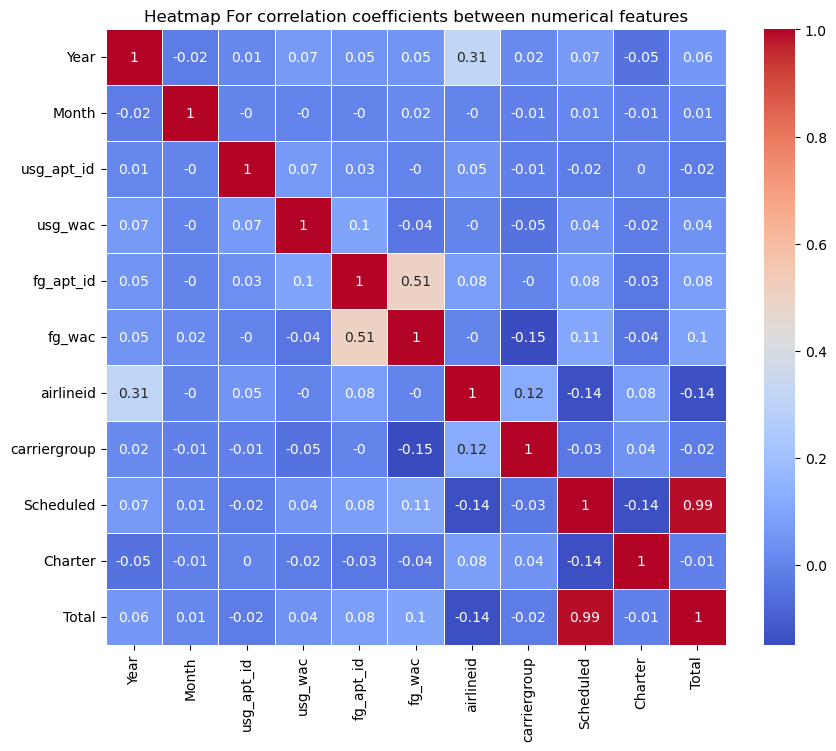

In [33]:
# رسم Heatmap لمعاملات الارتباط
plot_correlation_heatmap(dataset)

# Seventh: Data processing

## 1. Handling missing values

In [34]:
handle_missing_values(dataset)  # فحص ومعالجة القيم المفقودة

In [35]:
# فحص القيم المفقودة في مجموعة البيانات
missing_values = check_missing_values(dataset)
missing_values

data_dte        0
Year            0
Month           0
usg_apt_id      0
usg_apt         0
usg_wac         0
fg_apt_id       0
fg_apt          0
fg_wac          0
airlineid       0
carrier         0
carriergroup    0
type            0
Scheduled       0
Charter         0
Total           0
dtype: int64

## 2. Coding categorical data

In [36]:

# قائمة بأسماء الأعمدة الفئوية التي تحتاج إلى ترميز
categorical_columns = ["usg_apt", "fg_apt", "carrier","type"]

# استدعاء الدالة لترميز المتغيرات الفئوية
encoded_data = label_encode_categorical_variables(dataset, columns_to_encode=categorical_columns)


In [37]:

# عرض المجموعة البيانات المشفرة
encoded_data

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2006,2006,5,12016,366,5,13162,783,844,20177,509,1,0,0,10,10
1,05/01/2003,2003,5,10299,36,1,13856,979,736,20007,89,1,0,0,15,15
2,03/01/2007,2007,3,10721,113,13,12651,642,439,20402,302,1,0,0,1,1
3,12/01/2004,2004,12,11259,203,74,16271,1639,936,20201,147,1,0,0,1,1
4,05/01/2009,2009,5,13303,572,33,11075,276,219,21323,86,0,0,0,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,07/01/2000,2000,7,13303,572,33,13605,909,204,20398,449,1,0,1422,0,1422
930804,04/01/2019,2019,4,13303,572,33,14286,1086,162,19770,211,0,0,1439,0,1439
930805,08/01/2000,2000,8,13303,572,33,13605,909,204,20398,449,1,0,1441,0,1441
930806,09/01/2004,2004,9,12266,418,74,15632,1425,148,19534,146,0,0,1461,0,1461


## 3. Examining and treating outliers in numerical data

In [38]:

# معالجة القيم المتطرفة في البيانات العددية باستخدام IQR واستبدالها بالوسيطة
data_numeric_no_outliers = handle_outliers_iqr(encoded_data.select_dtypes(include=['int', 'float']), replace_with=dataset.median())


C:\Users\TOSHIBA\AppData\Local\Temp\ipykernel_5872\1264419281.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_numeric_no_outliers = handle_outliers_iqr(encoded_data.select_dtypes(include=['int', 'float']), replace_with=dataset.median())


In [39]:
# عرض مجموعة البيانات بعد معالجة القيم المتطرفة
data_numeric_no_outliers

,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,2006,5,12016.0,366,5,13162,783,844,20177.0,509,1,0,0.0,2.5,10.0
1,2003,5,10299.0,36,1,13856,979,736,20007.0,89,1,0,0.0,2.5,15.0
2,2007,3,10721.0,113,13,12651,642,439,20402.0,302,1,0,0.0,1.0,1.0
3,2004,12,11259.0,203,74,16271,1639,936,20201.0,147,1,0,0.0,1.0,1.0
4,2009,5,13303.0,572,33,11075,276,219,21224.0,86,0,0,0.0,2.5,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,2000,7,13303.0,572,33,13605,909,204,20398.0,449,1,0,150.0,0.0,145.5
930804,2019,4,13303.0,572,33,14286,1086,162,19770.0,211,0,0,150.0,0.0,145.5
930805,2000,8,13303.0,572,33,13605,909,204,20398.0,449,1,0,150.0,0.0,145.5
930806,2004,9,12266.0,418,74,15632,1425,148,19534.0,146,0,0,150.0,0.0,145.5


## 4. Standardize data measurement

In [41]:

# استدعاء الدالة لتقليل جميع المتغيرات العددية
scaled_data = scale_all_numeric_columns(data_numeric_no_outliers)

In [42]:

# عرض المجموعة البيانات المقللة
scaled_data

,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,-0.002496,-0.407593,-0.541460,-0.478671,-1.360535,-0.166965,-0.201834,1.309312,0.306866,0.696099,0.817584,0.0,-0.820623,2.164478,-0.653753
1,-0.353011,-0.407593,-1.811045,-1.832273,-1.505613,0.192137,0.194505,0.934320,-0.082309,-1.355441,0.817584,0.0,-0.820623,2.164478,-0.534240
2,0.114343,-0.983784,-1.499009,-1.516433,-1.070378,-0.431375,-0.486956,-0.096909,0.821951,-0.315017,0.817584,0.0,-0.820623,0.513069,-0.868878
3,-0.236173,1.609077,-1.101201,-1.147269,1.142066,1.441749,1.529115,1.628750,0.361809,-1.072133,0.817584,0.0,-0.820623,0.513069,-0.868878
4,0.348020,-0.407593,0.410174,0.366305,-0.344987,-1.246857,-1.227058,-0.860783,2.703727,-1.370095,-1.223116,0.0,-0.820623,2.164478,-0.414726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,-0.703527,0.168599,0.410174,0.366305,-0.344987,0.062260,0.052955,-0.912865,0.812794,0.403022,0.817584,0.0,2.633480,-0.587870,2.585062
930804,1.516404,-0.695689,0.410174,0.366305,-0.344987,0.414635,0.410873,-1.058696,-0.624865,-0.759517,-1.223116,0.0,2.633480,-0.587870,2.585062
930805,-0.703527,0.456694,0.410174,0.366305,-0.344987,0.062260,0.052955,-0.912865,0.812794,0.403022,0.817584,0.0,2.633480,-0.587870,2.585062
930806,-0.236173,0.744790,-0.356605,-0.265376,1.142066,1.111106,1.096378,-1.107306,-1.165131,-1.077018,-1.223116,0.0,2.633480,-0.587870,2.585062


# Eighth: Visualizing the data after processing it

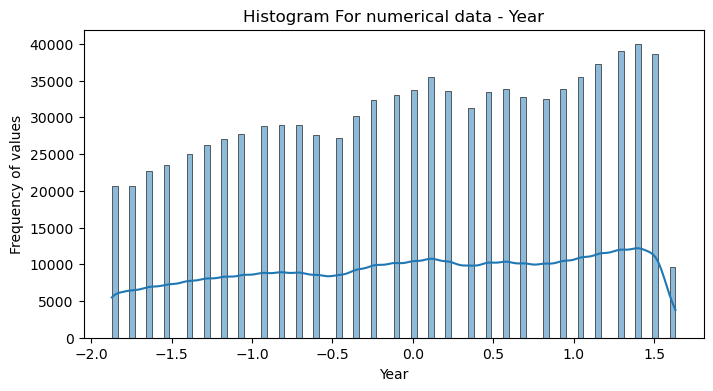

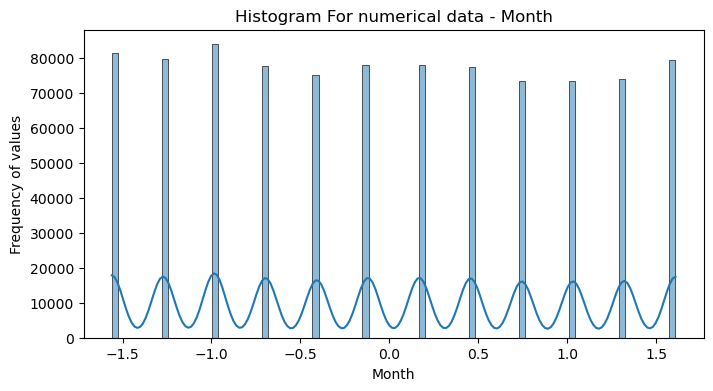

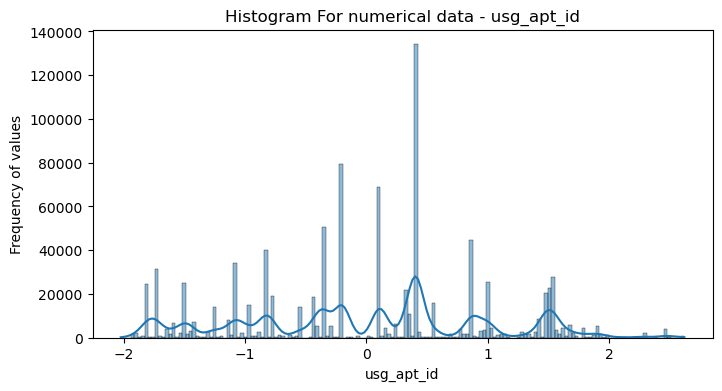

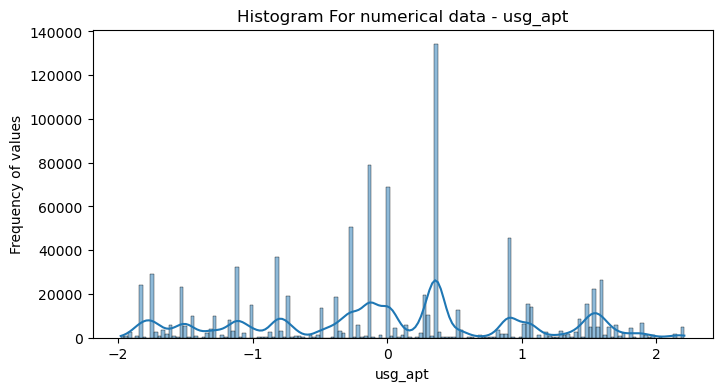

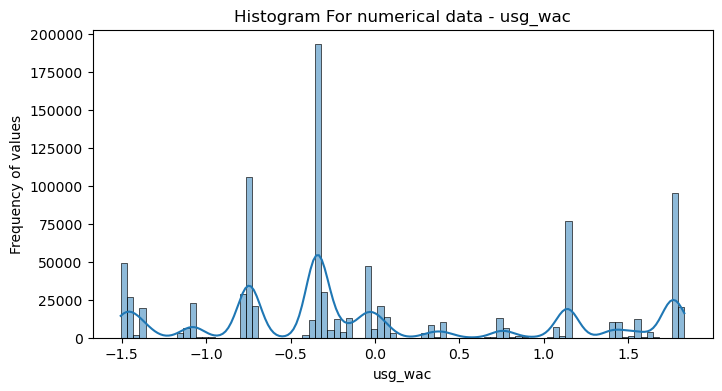

...

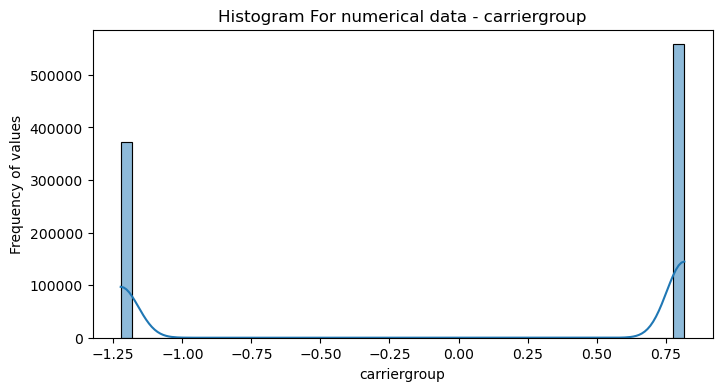

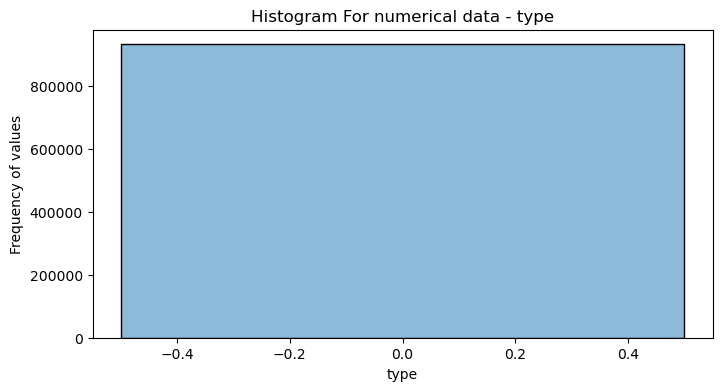

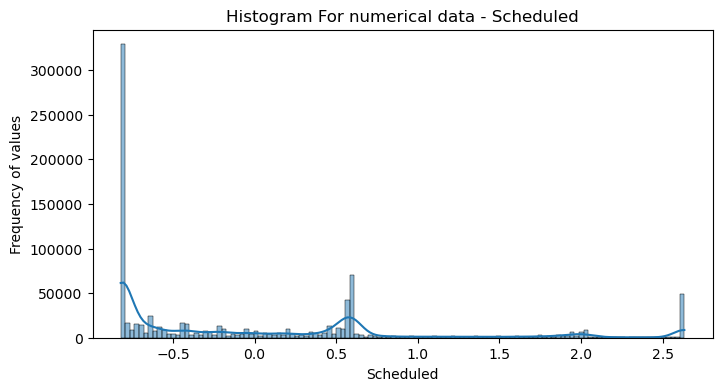

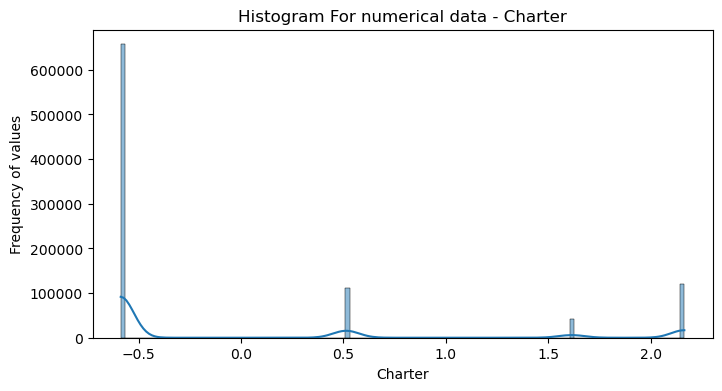

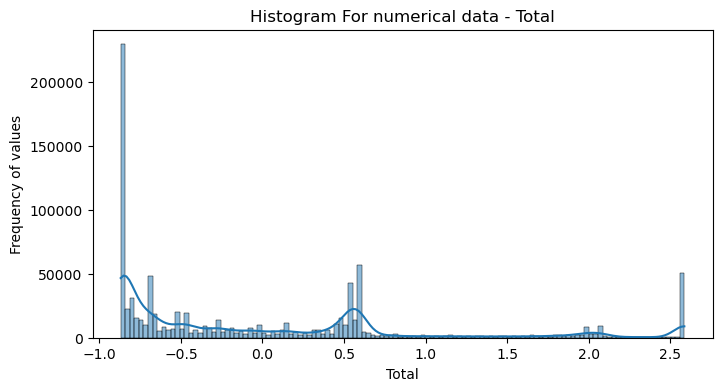

In [43]:
# استدعاء الدوال لرسم التصورات
plot_histograms(scaled_data)  # رسم histograms


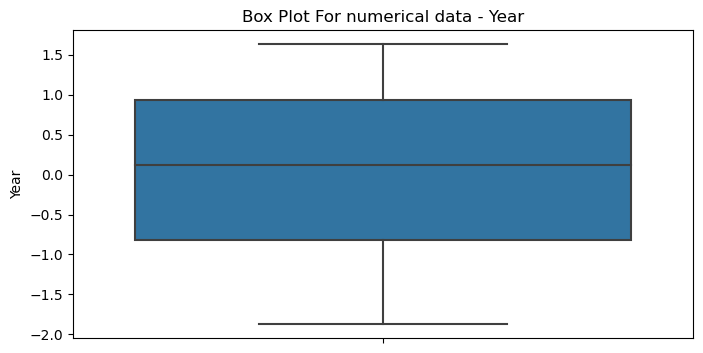

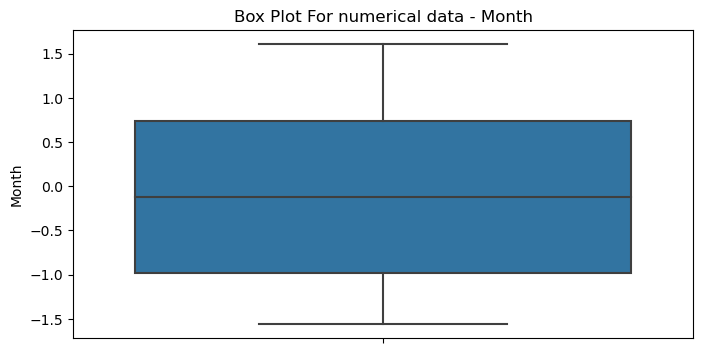

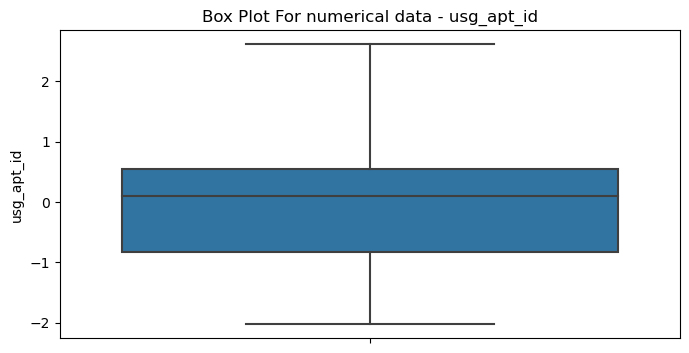

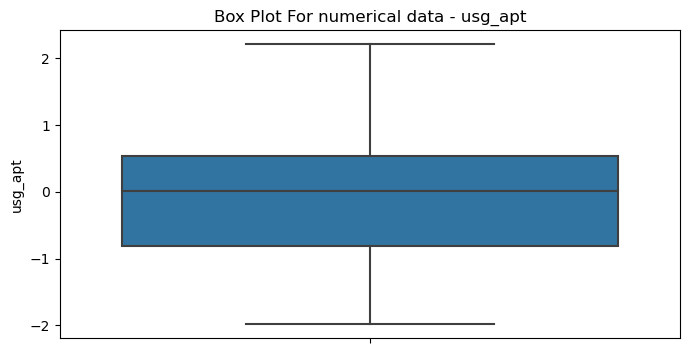

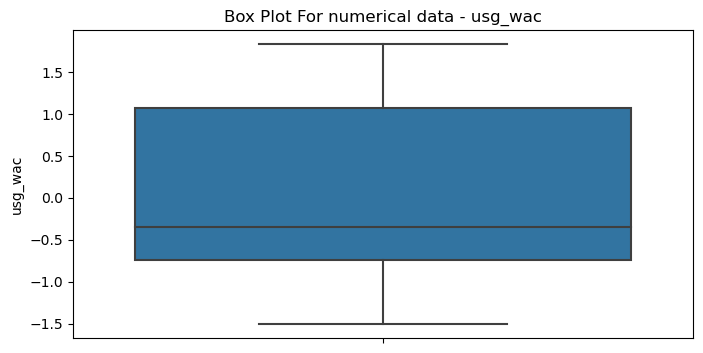

...

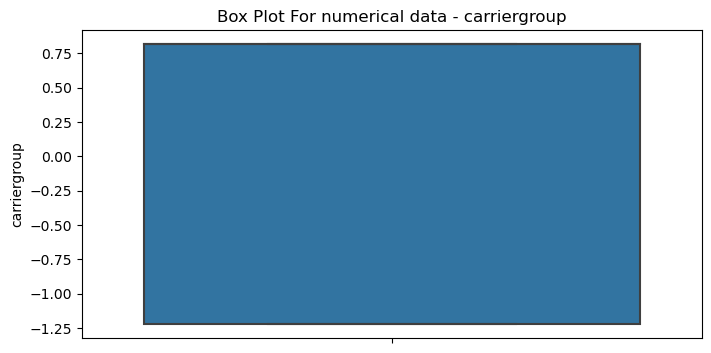

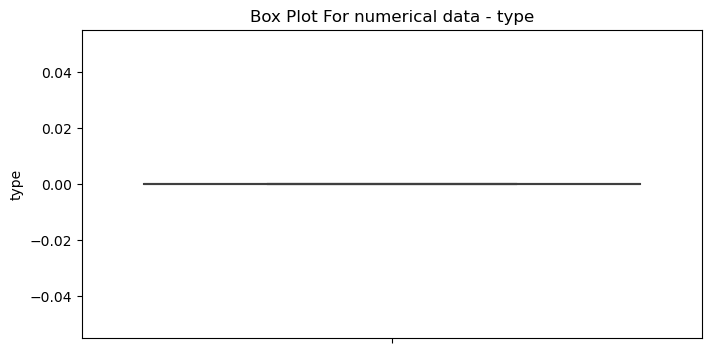

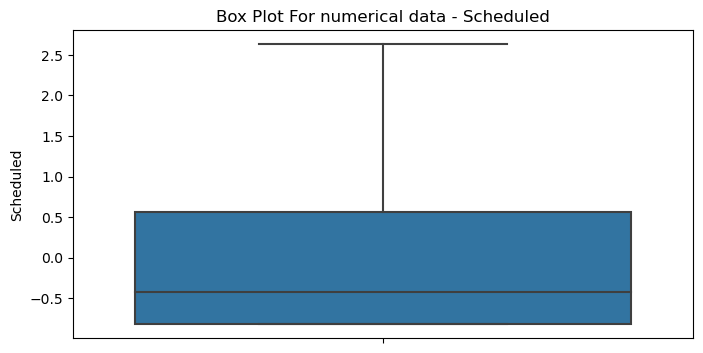

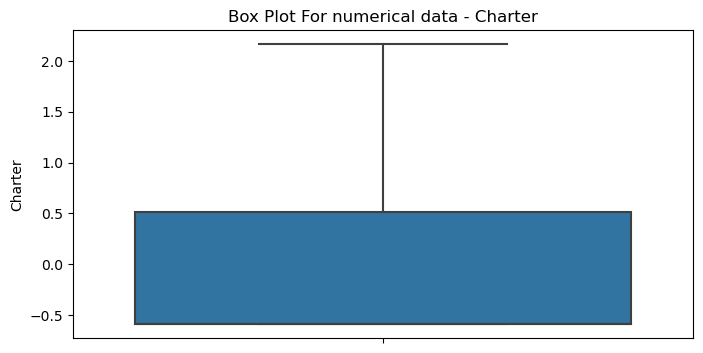

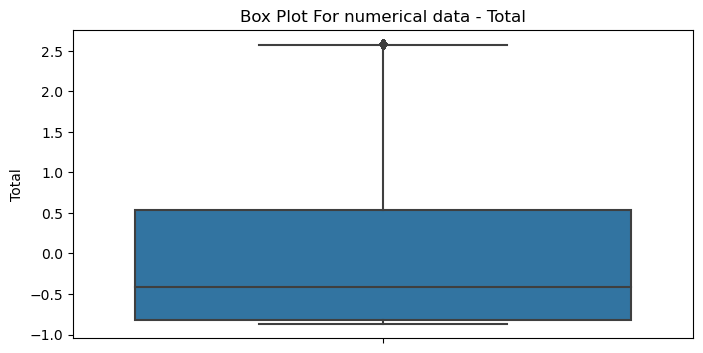

In [44]:
plot_box_plots(scaled_data)  # رسم box plots


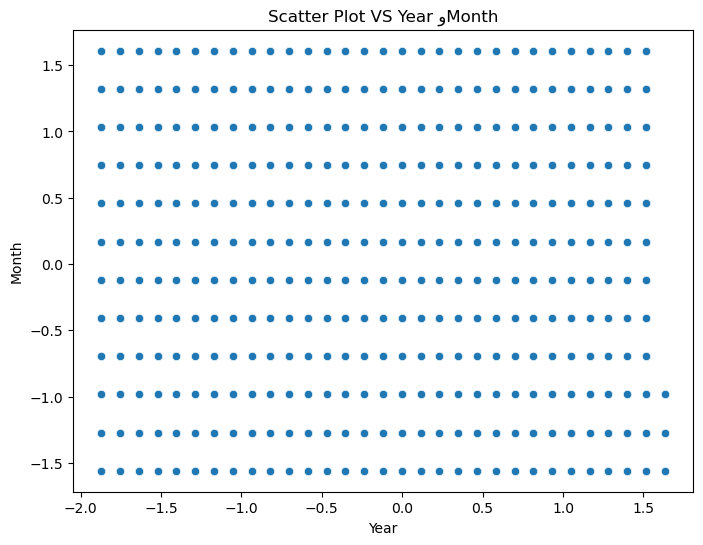

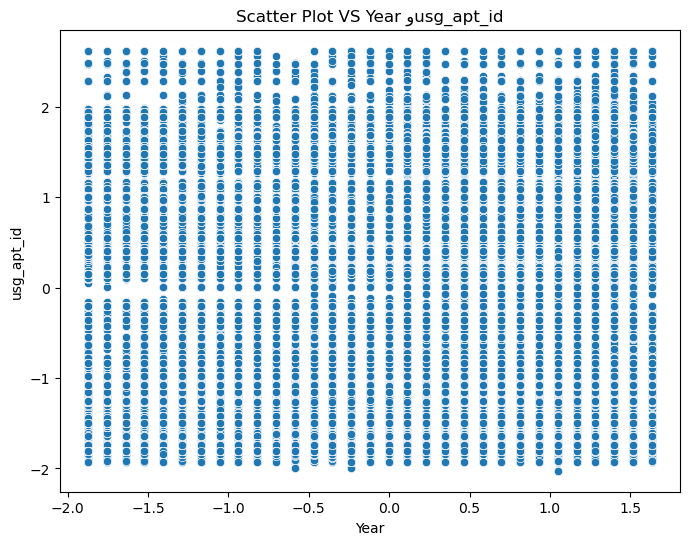

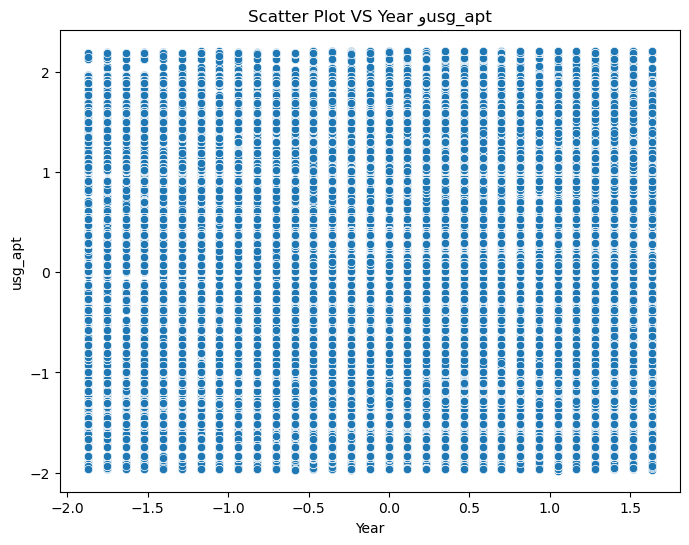

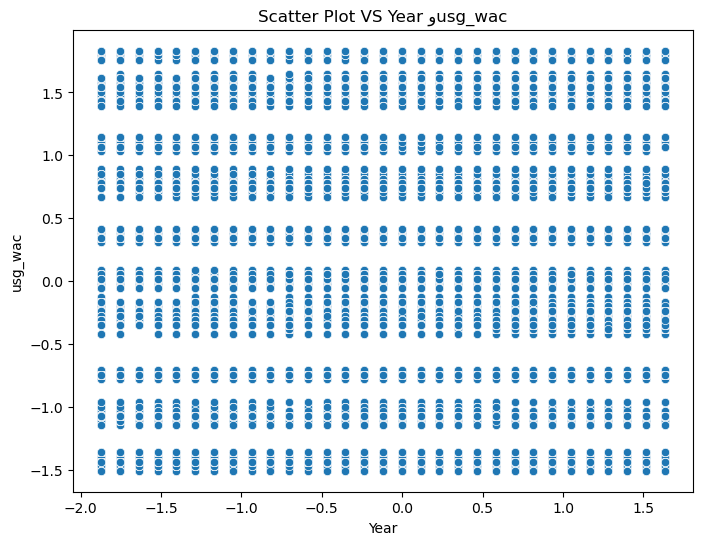

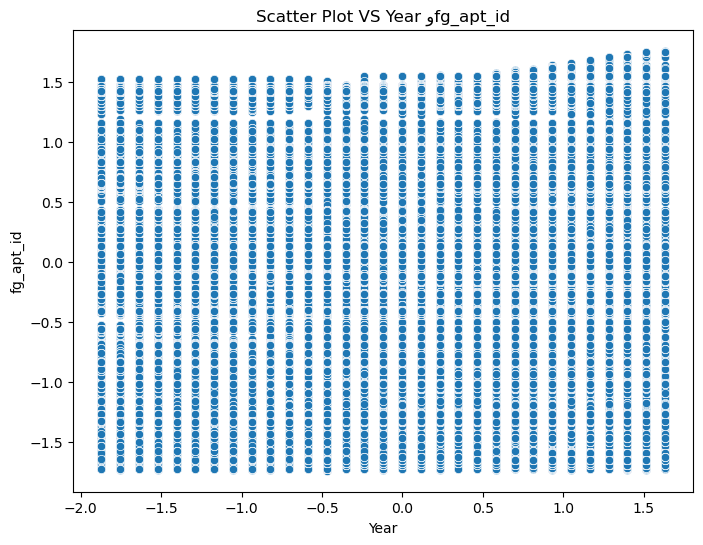

...

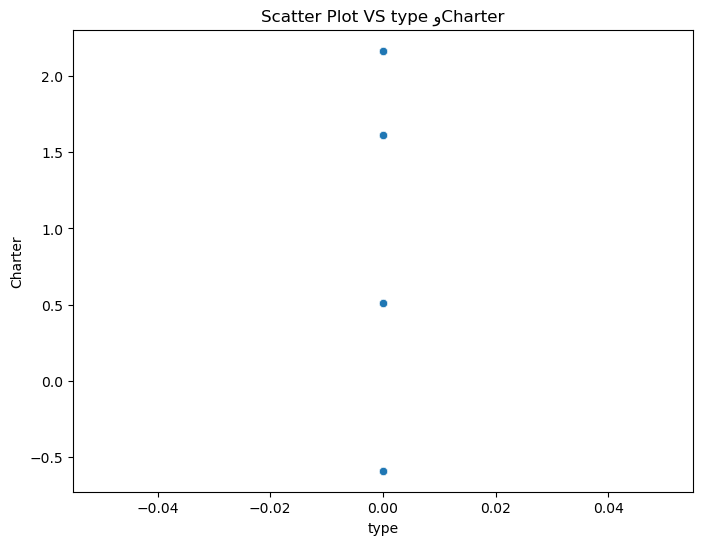

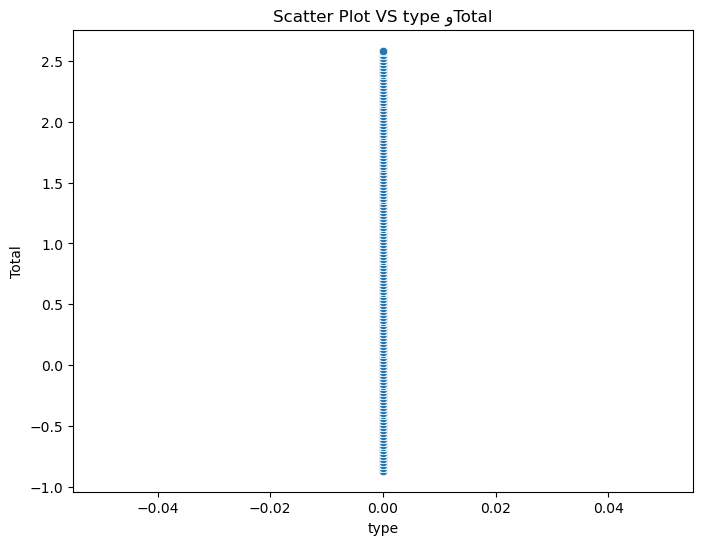

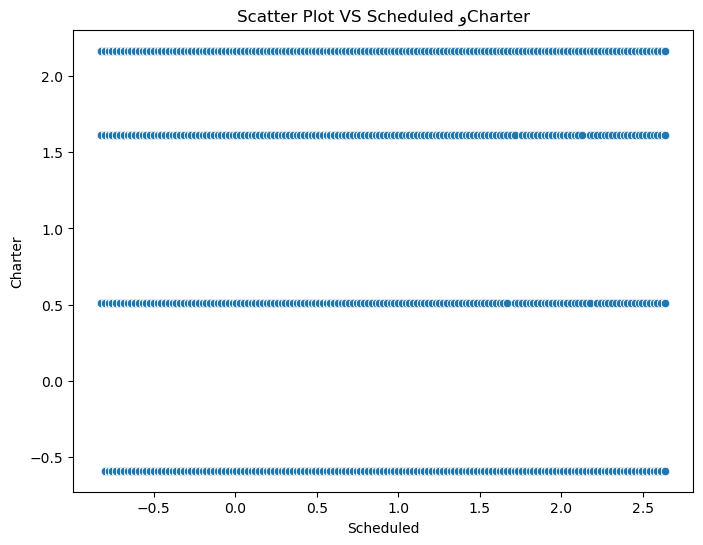

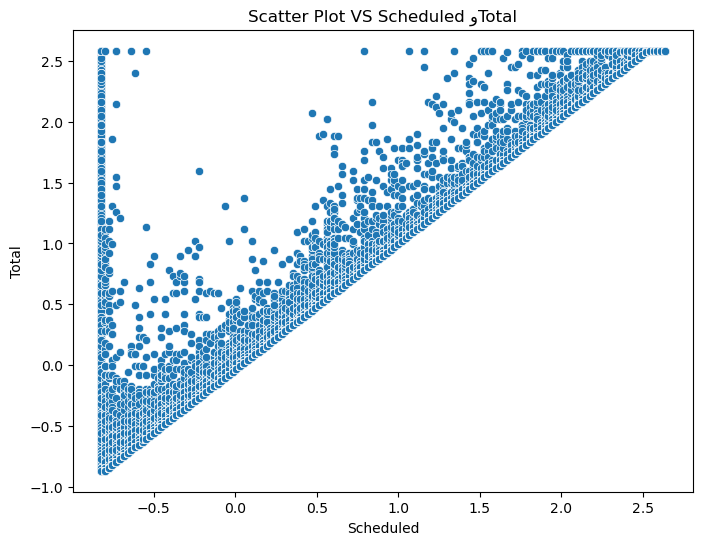

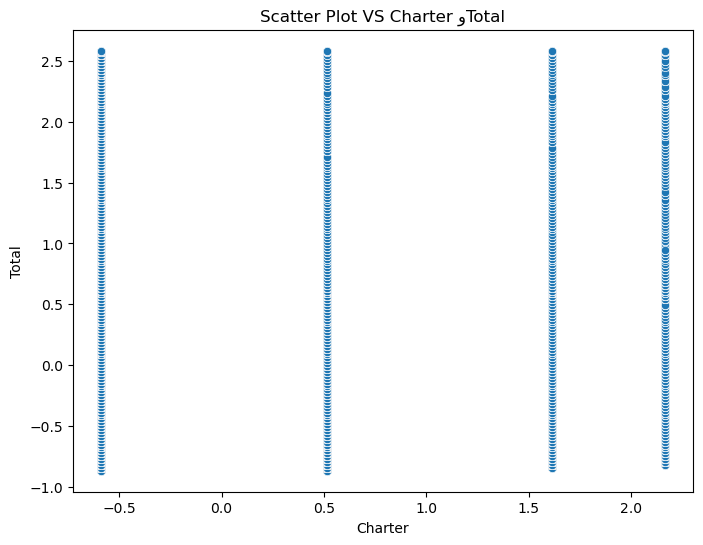

In [45]:

plot_scatter_plots(scaled_data)  # رسم scatter plots


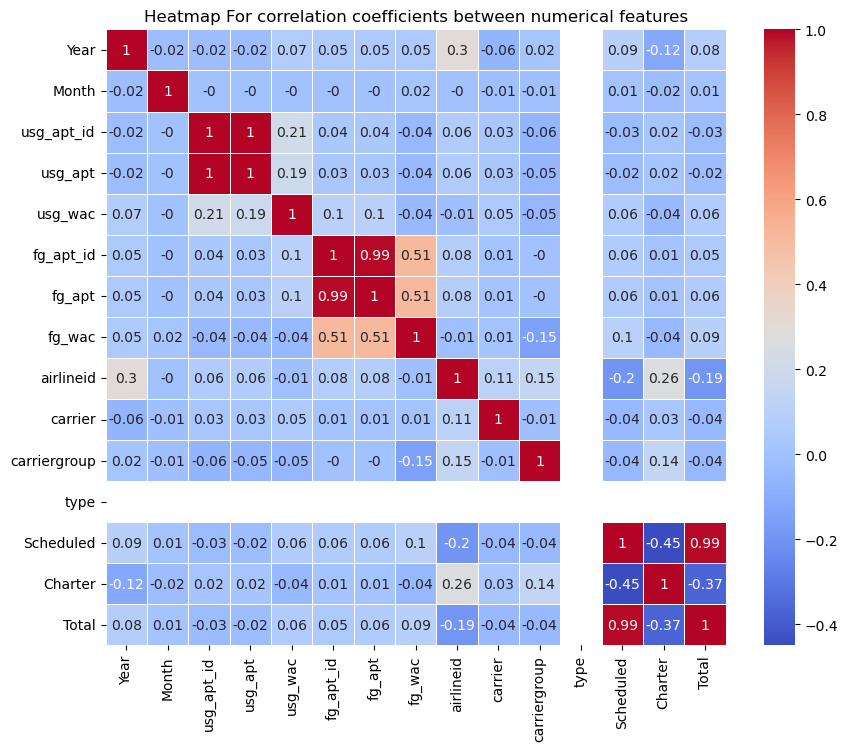

In [46]:

# رسم Heatmap لمعاملات الارتباط
plot_correlation_heatmap(scaled_data)
